# Asana Data Revisited: Semester In-Review

I previously did a [quick analysis](http://seangtkelley.me/blog/2018/06/05/asana-exploration) of the data from the Asana, the website I use to keep track of all my tasks.

Since it's been about 6 months since then, I thought it would be interesting to take another look to see which trends remained and which changed.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
from plotly import tools
import cufflinks as cf
from wordcloud import WordCloud
import nltk
import re
import string
import datetime

nltk.download('stopwords')
cachedStopWords = nltk.corpus.stopwords.words("english")
punct = set(string.punctuation)

init_notebook_mode(connected=True)
cf.set_config_file(world_readable=True, offline=True)

[nltk_data] Downloading package stopwords to /home/sean/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Data

Unlike last time, I'll only be pulling the tasks related to school. Just before the start of last semester (Fall 2018), I created a new project using the "Boards" type so that I could see all my school tasks at once in columns for each class.

First, let's load that data.

In [2]:
f18_df = pd.read_csv('asana-umass-f18.csv', parse_dates=[1, 2, 3, 8, 9])
f18_df.head()

,Task ID,Created At,Completed At,Last Modified,Name,Column,Assignee,Assignee Email,Start Date,Due Date,Tags,Notes,Projects,Parent Task
0,949672124046393,2018-12-17,2018-12-19,2018-12-19,training script to take only outputs for annot...,Research,NaN,NaN,NaT,NaT,NaN,NaN,UMass,NaN
1,949607828976735,2018-12-17,2018-12-18,2018-12-18,make generate preds output .npy file with pred...,Research,NaN,NaN,NaT,NaT,NaN,NaN,UMass,NaN
2,949607828976733,2018-12-17,2018-12-18,2018-12-18,option for generate preds script for not rotat...,Research,NaN,NaN,NaT,NaT,NaN,NaN,UMass,NaN
3,949607828976731,2018-12-17,2018-12-18,2018-12-18,make generate preds scripts output rboxes inst...,Research,NaN,NaN,NaT,NaT,NaN,NaN,UMass,NaN
4,949607828976727,2018-12-17,2018-12-18,2018-12-18,nms,Research,NaN,NaN,NaT,NaT,NaN,NaN,UMass,NaN


Next, we can load the previous data to get some sweet comparison visualizations.

In [3]:
old_df = pd.read_csv('School.csv', parse_dates=[1, 2, 3, 7, 8])
old_df.tail()

,Task ID,Created At,Completed At,Last Modified,Name,Assignee,Assignee Email,Start Date,Due Date,Tags,Notes,Projects,Parent Task
804,351764138393835,2017-05-29,2017-05-30,2017-05-30,brand new congress questions,NaN,NaN,NaT,NaT,NaN,NaN,School,NaN
805,351764138393836,2017-05-29,2017-05-29,2017-05-29,sign up for learnupon brand new congress,NaN,NaN,NaT,NaT,NaN,NaN,School,NaN
806,351764138393838,2017-05-29,2017-06-28,2017-06-28,create base for Hodler app,NaN,NaN,NaT,NaT,NaN,NaN,School,NaN
807,351779687262554,2017-05-29,2017-06-28,2017-06-28,battery life on lappy ubuntu,NaN,NaN,NaT,NaT,NaN,NaN,School,NaN
808,356635261007682,2017-06-05,2017-06-28,2017-06-28,bnc volunteer training,NaN,NaN,NaT,NaT,NaN,NaN,School,NaN


In [6]:
all_df = pd.concat([old_df, f18_df], verify_integrity=True, ignore_index=True, sort=True)
all_df.head()

,Assignee,Assignee Email,Column,Completed At,Created At,Due Date,Last Modified,Name,Notes,Parent Task,Projects,Start Date,Tags,Task ID
0,NaN,NaN,NaN,2018-04-15,2018-04-15,NaT,2018-04-15,More debt,NaN,NaN,School,NaT,NaN,148623786710031
1,NaN,NaN,NaN,2018-04-07,2018-04-06,NaT,2018-04-07,Send one line email to erik to add you to the ...,NaN,NaN,School,NaT,NaN,148623786710030
2,NaN,NaN,NaN,2018-03-27,2018-03-27,NaT,2018-03-27,withdraw from study abroad,NaN,NaN,School,NaT,NaN,610060357624798
3,NaN,NaN,NaN,2018-03-26,2018-03-09,NaT,2018-03-26,hold,NaN,NaN,School,NaT,NaN,588106896688257
4,NaN,NaN,NaN,2018-02-23,2018-02-22,2018-02-23,2018-02-23,find joydeep,NaN,NaN,School,NaT,NaN,570162249229318


To help retain our sanity, let's define colors for each semester for graphs.

In [17]:
all_color = 'rgba(219, 64, 82, 0.7)'
old_color = 'rgba(63, 81, 191, 1.0)'
f18_color = 'rgba(33, 150, 255, 1.0)'

### Task Creation Day of Week Comparison

Let's see if tasks where still created with the same daily frequencies. Since there are much more tasks in the old data, we can normalize the value counts for a fair comparison. For the sake of keeping the code clean and the x-axis in order, I decided keep the days of the week as numbers. For reference, 0 is Monday.

In [12]:
old_df['Created At DOW'] = old_df['Created At'].dt.dayofweek
f18_df['Created At DOW'] = f18_df['Created At'].dt.dayofweek

In [13]:
trace1 = go.Bar(
    x=old_df['Created At DOW'].value_counts(normalize=True).keys(),
    y=old_df['Created At DOW'].value_counts(normalize=True).values,
    name='Old Data',
    marker={
        'color': old_color
    }
)
trace2 = go.Bar(
    x=f18_df['Created At DOW'].value_counts(normalize=True).keys(),
    y=f18_df['Created At DOW'].value_counts(normalize=True).values,
    name='Fall 18',
    marker={
        'color': f18_color
    }
)

data = [trace1, trace2]
layout = go.Layout(
    barmode='group'
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='DOW Comparison')

This was quite a surprise. The days when I created tasks seems to have changed significantly this semester. 

Let's check if the overall trend has remained the same.

In [19]:
all_df['Created At DOW'] = all_df['Created At'].dt.dayofweek

trace1 = go.Bar(
    x=all_df['Created At DOW'].value_counts(normalize=True).keys(),
    y=all_df['Created At DOW'].value_counts(normalize=True).values,
    name='All Data',
    marker={
        'color': all_color
    }
)

data = [trace1]
layout = go.Layout(
    barmode='group'
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='DOW Comparison')

There are definitely some small changes. Thursday caught up to Wednesday and Monday is catching up to Tuesday. However, the overall trend of the majority of task creation occuring in the beginning of the week remains strong.

### Completion Time

Next, let's look at the duration it took for me to complete each task. Because I used the `parse_dates` parameter when importing the CSVs, using the minus operator will return [timedelta objects](https://docs.python.org/2/library/datetime.html#timedelta-objects). Since Asana only provided dates without time, tasks with a duration of 0 days are ones that were created and completed on the same day.

Having already found outliers in the last analysis, let's only consider only tasks that took less than 30 days to complete. Again, we normalize for a better comparison.

In [28]:
old_df['Duration'] = (old_df['Completed At'] - old_df['Created At'])
f18_df['Duration'] = (f18_df['Completed At'] - f18_df['Created At'])

In [30]:
trace1 = go.Bar(
    x=old_df[(old_df['Duration'].astype('timedelta64[D]') < 30)]['Duration'].value_counts(normalize=True).keys().days,
    y=old_df[(old_df['Duration'].astype('timedelta64[D]') < 30)]['Duration'].value_counts(normalize=True).values,
    name='Old Data',
    marker={
        'color': old_color
    }
)
trace2 = go.Bar(
    x=f18_df[(f18_df['Duration'].astype('timedelta64[D]') < 30)]['Duration'].value_counts(normalize=True).keys().days,
    y=f18_df[(f18_df['Duration'].astype('timedelta64[D]') < 30)]['Duration'].value_counts(normalize=True).values,
    name='Fall 18',
    marker={
        'color': f18_color
    }
)
data = [trace1, trace2]
layout = go.Layout(
    barmode='group'
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='grouped-bar')

Now this is interesting! For the most part, the time it takes me to complete tasks seems to have remained relatively the same. However, this semester it seems I create more tasks that take around a week to complete. In addition, I made less tasks that were completed in the same day.

Next, like last time, let's see if we can figure out what type of tasks usually take longer to complete. I will once again use the fantastic [word_cloud library](http://amueller.github.io/word_cloud/index.html) by [amueller](http://amueller.github.io/).

(-0.5, 399.5, 199.5, -0.5)

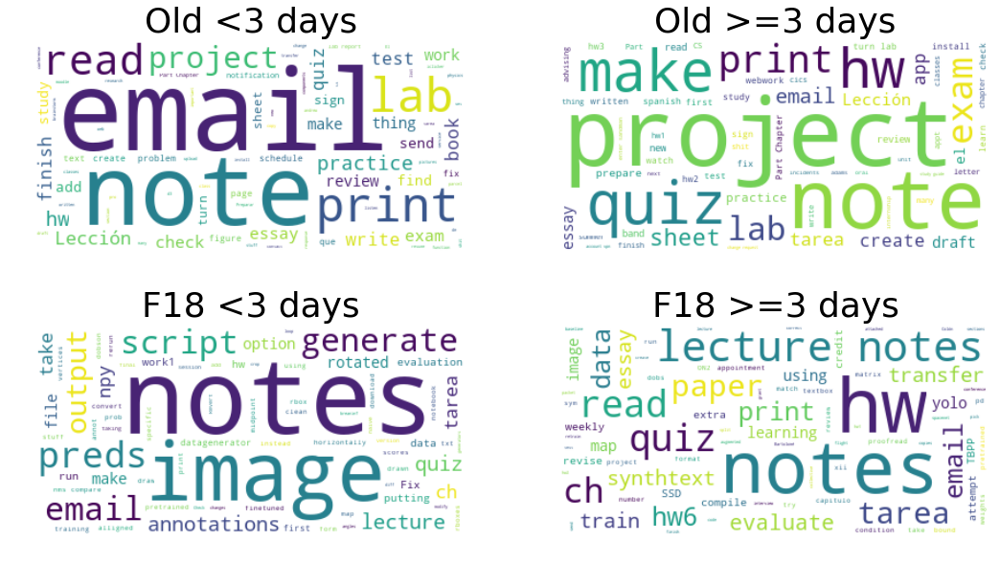

In [39]:
# concatenate all name fields from tasks separated by duration of 3 days
old_less_text = ' '.join(list(old_df[old_df['Duration'].astype('timedelta64[D]') < 3]['Name'].dropna()))
old_grtr_text = ' '.join(list(old_df[old_df['Duration'].astype('timedelta64[D]') >= 3]['Name'].dropna()))

f18_less_text = ' '.join(list(f18_df[f18_df['Duration'].astype('timedelta64[D]') < 3]['Name'].dropna()))
f18_grtr_text = ' '.join(list(f18_df[f18_df['Duration'].astype('timedelta64[D]') >= 3]['Name'].dropna()))

# remove any punctuation
old_less_text = ''.join(ch for ch in old_less_text if ch not in punct)
old_grtr_text = ''.join(ch for ch in old_grtr_text if ch not in punct)

f18_less_text = ''.join(ch for ch in f18_less_text if ch not in punct)
f18_grtr_text = ''.join(ch for ch in f18_grtr_text if ch not in punct)

# remove stopwords
old_less_text = ' '.join([word for word in old_less_text.split() if word not in cachedStopWords])
old_grtr_text = ' '.join([word for word in old_grtr_text.split() if word not in cachedStopWords])

f18_less_text = ' '.join([word for word in f18_less_text.split() if word not in cachedStopWords])
f18_grtr_text = ' '.join([word for word in f18_grtr_text.split() if word not in cachedStopWords])

# create wordclouds
old_less_wordcloud = WordCloud(background_color="white", max_words=1000, margin=10,random_state=1).generate(old_less_text)
old_grtr_wordcloud = WordCloud(background_color="white", max_words=1000, margin=10,random_state=1).generate(old_grtr_text)

f18_less_wordcloud = WordCloud(background_color="white", max_words=1000, margin=10,random_state=1).generate(f18_less_text)
f18_grtr_wordcloud = WordCloud(background_color="white", max_words=1000, margin=10,random_state=1).generate(f18_grtr_text)

# display wordclouds using matplotlib
f, axes = plt.subplots(2, 2, sharex=True)
f.set_size_inches(18, 10)
axes[0, 0].imshow(old_less_wordcloud, interpolation="bilinear")
axes[0, 0].set_title('Old <3 days', fontsize=36)
axes[0, 0].axis("off")
axes[0, 1].imshow(old_grtr_wordcloud, interpolation="bilinear")
axes[0, 1].set_title('Old >=3 days', fontsize=36)
axes[0, 1].axis("off")

axes[1, 0].imshow(f18_less_wordcloud, interpolation="bilinear")
axes[1, 0].set_title('F18 <3 days', fontsize=36)
axes[1, 0].axis("off")
axes[1, 1].imshow(f18_grtr_wordcloud, interpolation="bilinear")
axes[1, 1].set_title('F18 >=3 days', fontsize=36)
axes[1, 1].axis("off")

A few things changed this semester. The research project I was on during the semester was pretty demanding so a lot of those tasks show up like `image`, `preds`, or `synthtext`. Also, since none of my classes had projects this semester, that doesn't show up.

However, some things remained the same. Homework usually takes more than 3 days and I still have to put a few days of studying before quizzes.

### Overdue Tasks

Next, let's take a look at overdue tasks.

In [41]:
old_df['Overdue'] = old_df['Completed At'] - old_df['Due Date']
f18_df['Overdue'] = f18_df['Completed At'] - f18_df['Due Date']

In [43]:
trace1 = go.Bar(
    x=old_df['Overdue'].value_counts(normalize=True).keys().days,
    y=old_df['Overdue'].value_counts(normalize=True).values,
    name='Old Data'
)
trace2 = go.Bar(
    x=f18_df['Overdue'].value_counts(normalize=True).keys().days,
    y=f18_df['Overdue'].value_counts(normalize=True).values,
    name='Fall 18'
)
data = [trace1, trace2]
layout = go.Layout(
    barmode='group'
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='grouped-bar')

Seems like I did alright staying on top of things this semester.

---

Again, let's use wordclouds to check out what might be causing me to miss due dates.

(-0.5, 399.5, 0.0, 1.0)

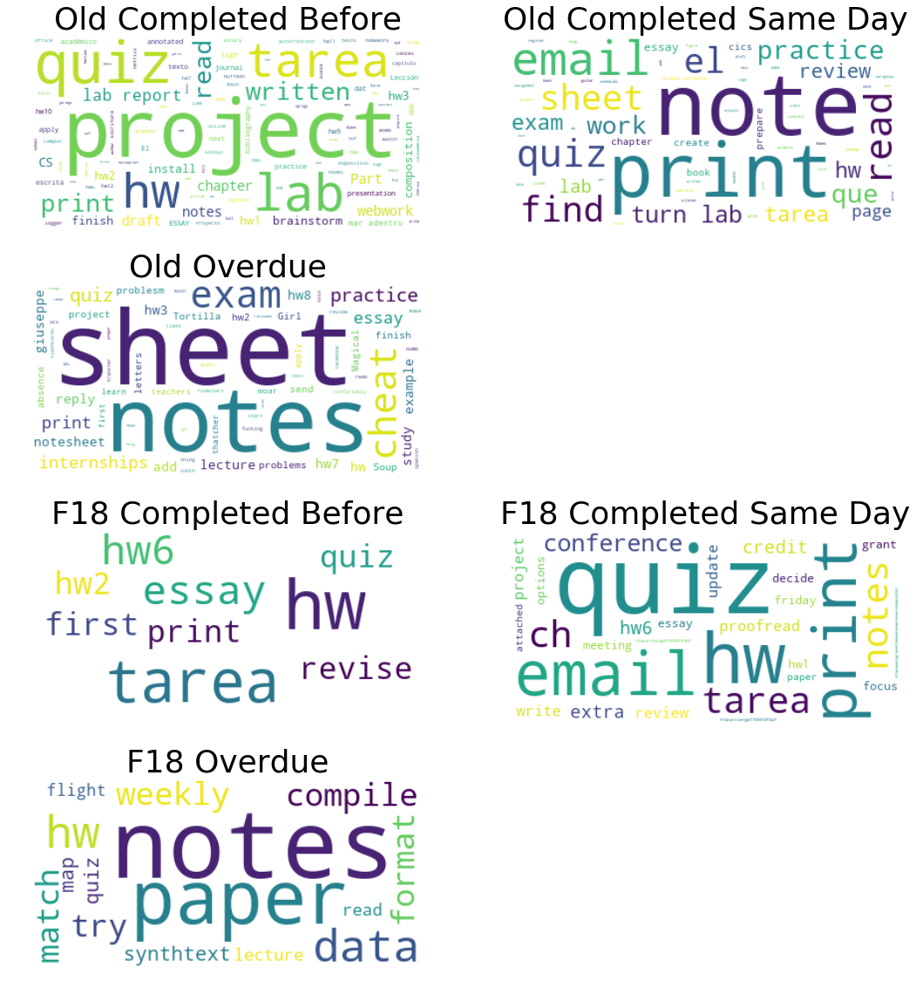

In [49]:
# concatenate all name fields from overdue tasks
old_before_text = ' '.join(list(old_df[old_df['Overdue'].astype('timedelta64[D]') < 0]['Name'].dropna()))
old_sameday_text = ' '.join(list(old_df[old_df['Overdue'].astype('timedelta64[D]') == 0]['Name'].dropna()))
old_overdue_text = ' '.join(list(old_df[old_df['Overdue'].astype('timedelta64[D]') > 0]['Name'].dropna()))

f18_before_text = ' '.join(list(f18_df[f18_df['Overdue'].astype('timedelta64[D]') < 0]['Name'].dropna()))
f18_sameday_text = ' '.join(list(f18_df[f18_df['Overdue'].astype('timedelta64[D]') == 0]['Name'].dropna()))
f18_overdue_text = ' '.join(list(f18_df[f18_df['Overdue'].astype('timedelta64[D]') > 0]['Name'].dropna()))

# remove any punctuation
old_before_text = ''.join(ch for ch in old_before_text if ch not in punct)
old_sameday_text = ''.join(ch for ch in old_sameday_text if ch not in punct)
old_overdue_text = ''.join(ch for ch in old_overdue_text if ch not in punct)

f18_before_text = ''.join(ch for ch in f18_before_text if ch not in punct)
f18_sameday_text = ''.join(ch for ch in f18_sameday_text if ch not in punct)
f18_overdue_text = ''.join(ch for ch in f18_overdue_text if ch not in punct)

# remove stopwords
old_before_text = ' '.join([word for word in old_before_text.split() if word not in cachedStopWords])
old_sameday_text = ' '.join([word for word in old_sameday_text.split() if word not in cachedStopWords])
old_overdue_text = ' '.join([word for word in old_overdue_text.split() if word not in cachedStopWords])

f18_before_text = ' '.join([word for word in f18_before_text.split() if word not in cachedStopWords])
f18_sameday_text = ' '.join([word for word in f18_sameday_text.split() if word not in cachedStopWords])
f18_overdue_text = ' '.join([word for word in f18_overdue_text.split() if word not in cachedStopWords])

# create wordclouds
old_before_wordcloud = WordCloud(background_color="white", max_words=1000, margin=10,random_state=1).generate(old_before_text)
old_sameday_wordcloud = WordCloud(background_color="white", max_words=1000, margin=10,random_state=1).generate(old_sameday_text)
old_overdue_wordcloud = WordCloud(background_color="white", max_words=1000, margin=10,random_state=1).generate(old_overdue_text)

f18_before_wordcloud = WordCloud(background_color="white", max_words=1000, margin=10,random_state=1).generate(f18_before_text)
f18_sameday_wordcloud = WordCloud(background_color="white", max_words=1000, margin=10,random_state=1).generate(f18_sameday_text)
f18_overdue_wordcloud = WordCloud(background_color="white", max_words=1000, margin=10,random_state=1).generate(f18_overdue_text)

# display wordclouds using matplotlib
f, axes = plt.subplots(4, 2, sharex=True)
f.set_size_inches(18, 20)
ax1.imshow(before_wordcloud, interpolation="bilinear")
ax1.set_title('Completed Before', fontsize=36)
ax1.axis("off")
ax2.imshow(sameday_wordcloud, interpolation="bilinear")
ax2.set_title('Completed Same Day', fontsize=36)
ax2.axis("off")
ax3.imshow(overdue_wordcloud, interpolation="bilinear")
ax3.set_title('Overdue', fontsize=36)
ax3.axis("off")
ax4.axis("off")

axes[0, 0].imshow(old_before_wordcloud, interpolation="bilinear")
axes[0, 0].set_title('Old Completed Before', fontsize=36)
axes[0, 0].axis("off")
axes[0, 1].imshow(old_sameday_wordcloud, interpolation="bilinear")
axes[0, 1].set_title('Old Completed Same Day', fontsize=36)
axes[0, 1].axis("off")
axes[1, 0].imshow(old_overdue_wordcloud, interpolation="bilinear")
axes[1, 0].set_title('Old Overdue', fontsize=36)
axes[1, 0].axis("off")
axes[1, 1].axis("off")

axes[2, 0].imshow(f18_before_wordcloud, interpolation="bilinear")
axes[2, 0].set_title('F18 Completed Before', fontsize=36)
axes[2, 0].axis("off")
axes[2, 1].imshow(f18_sameday_wordcloud, interpolation="bilinear")
axes[2, 1].set_title('F18 Completed Same Day', fontsize=36)
axes[2, 1].axis("off")
axes[3, 0].imshow(f18_overdue_wordcloud, interpolation="bilinear")
axes[3, 0].set_title('F18 Overdue', fontsize=36)
axes[3, 0].axis("off")
axes[3, 1].axis("off")

There are definitely less data for this semester but lots of the same words appear.

## Conclusion
Hopefully this post show the motivation and potential benefit of revisiting a previous analysis in an attempt to find an significant changes. In the context of personal development, doing so can help you track your progress and meet your goals. I still definitely need to put more effort into taking notes on time!